Benchmark of MOB


In [1]:
import os,sys
sys.path.append(os.path.realpath(os.path.join(os.getcwd(), '..')))
import warnings
import scanpy as sc
import anndata as ad
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import mucostx as mx

In [2]:
opt = mx.config()
args = opt.parse_args(['--gpu', '0'])
args.dataset_path = '/mnt/d/Dataset/SRT_Dataset/MOB/'
args.elastic_corr = True
args.srt_resolution = 50
if args.version.split('-')[0] != 'dev':
    warnings.filterwarnings("ignore")
args

Namespace(amp=True, batch_size=512, clusters=0, dataset_path='/mnt/d/Dataset/SRT_Dataset/MOB/', dropout=0.3, elastic_corr=True, flow='source_to_target', gpu=0, hvgs=3000, latent_dim=64, log_file='../Log', log_steps=20, lr=0.001, max_epoch=100, max_neighbors=6, mode_rknn='rknn', n_spot=0, out_file='../Output', project_name='MoCoSTX', seed=2024, srt_resolution=50, tau=0.05, version='dev-1.0', visual=True, wegiht_decay=0.0001)

In [3]:
mx.set_random_seed(args.seed)

In [4]:
# sections = ['151673', '151674', '151675', '151676']
sections = ['Stereo-seq_MoB.h5ad', 'Slide-seqV2_MoB.h5ad']
# sections = ['151507', '151508', '151509', '151510','151669', '151670', '151671', '151672', '151673', '151674', '151675', '151676']

In [5]:
adata_list = []
for section in sections:
    # adata = sc.read_visium(os.path.join(args.dataset_path+section))
    adata = sc.read_h5ad(os.path.join(args.dataset_path+section))
    adata.var_names_make_unique()
    sc.pp.filter_genes(adata, min_cells=50)
    adata_list.append(adata)
adata_list

[AnnData object with n_obs × n_vars = 19109 × 14376
     var: 'n_cells'
     obsm: 'spatial',
 AnnData object with n_obs × n_vars = 20139 × 11750
     var: 'n_cells'
     obsm: 'spatial']

整合前的效果

In [6]:
adata_raw = ad.concat(adata_list, keys=sections,label="slice_name", join='inner')
sc.pp.highly_variable_genes(adata_raw, flavor="seurat_v3", n_top_genes=3000)
global_hvg = adata_raw.var_names[adata_raw.var['highly_variable']]
sc.pp.filter_cells(adata_raw, min_genes=200)
sc.pp.normalize_total(adata_raw, target_sum=1e4)
sc.pp.log1p(adata_raw)
adata_raw = adata_raw[:, global_hvg]
sc.pp.scale(adata_raw, zero_center=True, max_value=10)

/home/zl/anaconda3/envs/pyg/lib/python3.8/site-packages/scanpy/preprocessing/_highly_variable_genes.py:64: UserWarning: `flavor='seurat_v3'` expects raw count data, but non-integers were found.
  warnings.warn(
/home/zl/anaconda3/envs/pyg/lib/python3.8/site-packages/scanpy/preprocessing/_simple.py:843: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)


In [7]:
adata_raw.obsm['spatial']

array([[ 6307.53785901, 12555.0078329 ],
       [ 9153.20472441, 12993.42913386],
       [ 9154.77625571, 11058.83561644],
       ...,
       [ 1508.        ,  3794.2       ],
       [ 2008.8       ,  5087.2       ],
       [ 4472.7       ,  4657.6       ]])

In [8]:
def mclust(adata, arg):
    from sklearn.decomposition import PCA
    pca = PCA(n_components=32, random_state=arg.seed)
    embedding = pca.fit_transform(adata.X.copy())
    adata.obsm['emb_pca'] = embedding
    import rpy2.robjects as r_objects
    r_objects.r.library("mclust")
    import rpy2.robjects.numpy2ri
    rpy2.robjects.numpy2ri.activate()
    r_random_seed = r_objects.r['set.seed']
    r_random_seed(arg.seed)
    rmclust = r_objects.r['Mclust']
    res = rmclust(rpy2.robjects.numpy2ri.numpy2rpy(adata.obsm['emb_pca']), arg.n_domain, 'EEE')

    mclust_res = np.array(res[-2])
    adata.obs['mclust'] = mclust_res
    adata.obs['mclust'] = adata.obs['mclust'].astype('int')
    adata.obs['mclust'] = adata.obs['mclust'].astype('category')

    return adata

R[write to console]:                    __           __ 
   ____ ___  _____/ /_  _______/ /_
  / __ `__ \/ ___/ / / / / ___/ __/
 / / / / / / /__/ / /_/ (__  ) /_  
/_/ /_/ /_/\___/_/\__,_/____/\__/   version 6.1.1
Type 'citation("mclust")' for citing this R package in publications.



fitting ...
  |======================================================================| 100%


/home/zl/anaconda3/envs/pyg/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/zl/anaconda3/envs/pyg/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


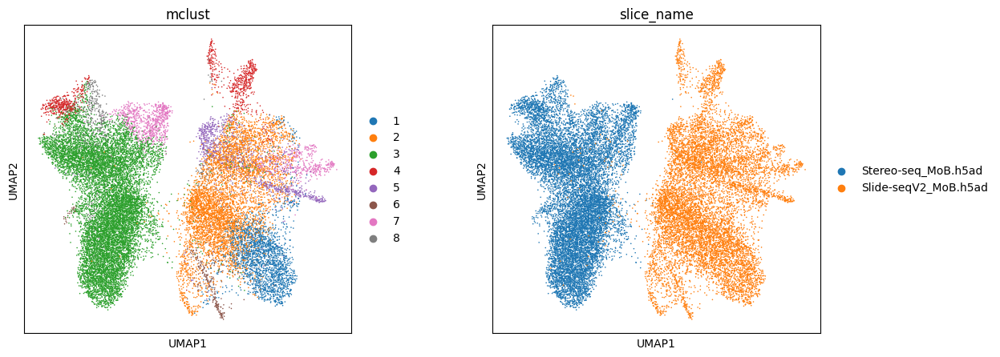

In [9]:
args.n_domain=8
adata_new0 = mclust(adata_raw, args)
sc.pp.neighbors(adata_new0, use_rep='emb_pca')
sc.tl.umap(adata_new0)
plt.rcParams["figure.figsize"] = (5, 5)
sc.pl.umap(adata_new0, color=["mclust", 'slice_name'], ncols=3,wspace=0.3, show=True)


训练

In [10]:
mucostx = mx.MuCoSTX1(adata_list, args)

/home/zl/anaconda3/envs/pyg/lib/python3.8/site-packages/scanpy/preprocessing/_highly_variable_genes.py:64: UserWarning: `flavor='seurat_v3'` expects raw count data, but non-integers were found.
  warnings.warn(
/home/zl/anaconda3/envs/pyg/lib/python3.8/site-packages/scanpy/preprocessing/_simple.py:843: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)
/home/zl/anaconda3/envs/pyg/lib/python3.8/site-packages/scanpy/preprocessing/_simple.py:843: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)


section 14044 and 10525 has 149909 mnn edges
Get the overall mnn graph...
number of node: 24569, 24569
number of edges: 299818
edge_index:
tensor([[    0,     0,     0,  ..., 24568, 24568, 24568],
        [14528, 15448, 15676,  ..., 11574, 12300, 13342]])
Data(x=[24569, 3003], edge_index=[2, 141464]) Data(x=[24569, 3003], edge_index=[2, 441282], edge_attr=[441282])


  0%|          | 0/100 [00:00<?, ?it/s]

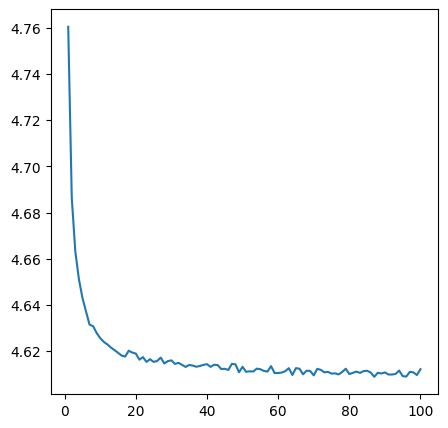

In [11]:
mucostx.train_emb()

Downstream workflow

In [12]:
list_new = mucostx.get_adata_all()
list_new

[AnnData object with n_obs × n_vars = 14044 × 3000
     obs: 'n_genes'
     var: 'n_cells', 'mean', 'std'
     uns: 'log1p'
     obsm: 'spatial', 'X_pca', 'mxb',
 AnnData object with n_obs × n_vars = 10525 × 3000
     obs: 'n_genes'
     var: 'n_cells', 'mean', 'std'
     uns: 'log1p'
     obsm: 'spatial', 'X_pca', 'mxb']

绘制等高线

In [13]:
adata_new1 = ad.concat(list_new, keys=sections,label="slice_name")

In [14]:
adata_new1

AnnData object with n_obs × n_vars = 24569 × 3000
    obs: 'n_genes', 'slice_name'
    obsm: 'spatial', 'X_pca', 'mxb'

In [15]:
from mucostx.utils import mclust
args.n_domain=9
adata_new1 = mclust(adata_new1, args, refine=False, use='mxb')

fitting ...
  |======================================================================| 100%


/home/zl/anaconda3/envs/pyg/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/zl/anaconda3/envs/pyg/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


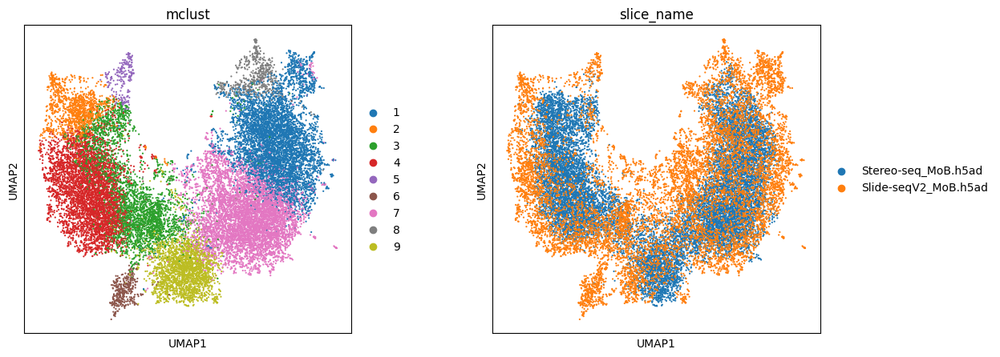

In [16]:
sc.pp.neighbors(adata_new1, use_rep='mxb')
sc.tl.umap(adata_new1)
plt.rcParams["figure.figsize"] = (5, 5)
sc.pl.umap(adata_new1, color=["mclust", 'slice_name'], size=10, ncols=3,wspace=0.3, show=True)

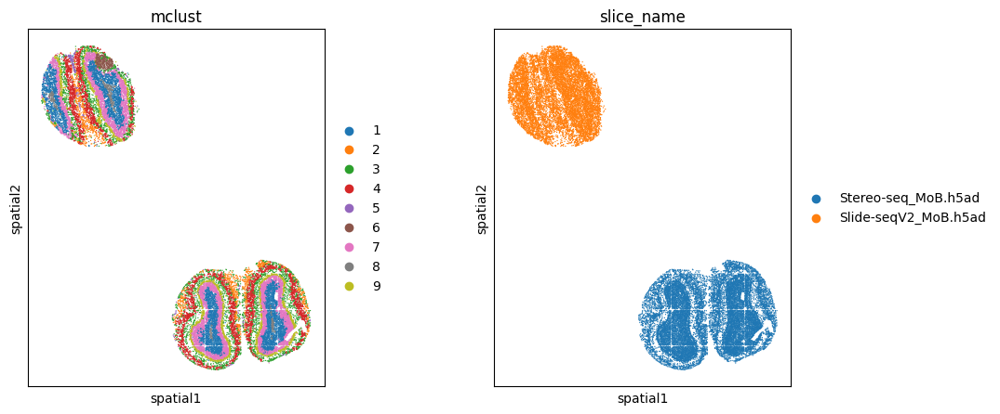

In [17]:
sc.pl.spatial(adata_new1,color=['mclust',"slice_name"], spot_size=50)

/home/zl/anaconda3/envs/pyg/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


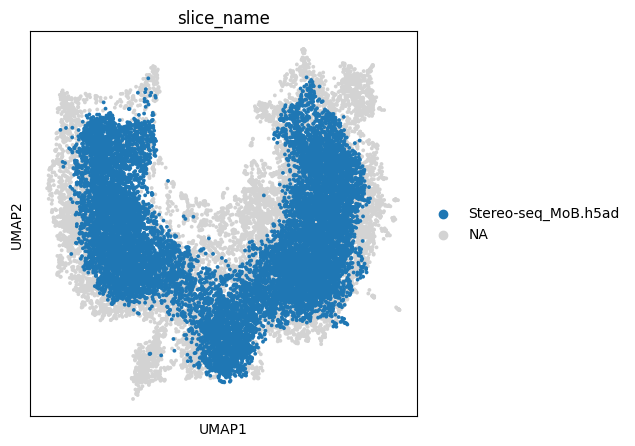

In [18]:
sc.pl.umap(adata_new1, color='slice_name', groups=[sections[0]],size=30)

batch corrected

In [19]:
adata_new = ad.concat(list_new, keys=sections,label="slice_name")
from mucostx.utils import mclust
args.n_domain=9
adata_new = mclust(adata_new, args, refine=False, use='mx')

KeyError: 'mx'

/home/zl/anaconda3/envs/pyg/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/zl/anaconda3/envs/pyg/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


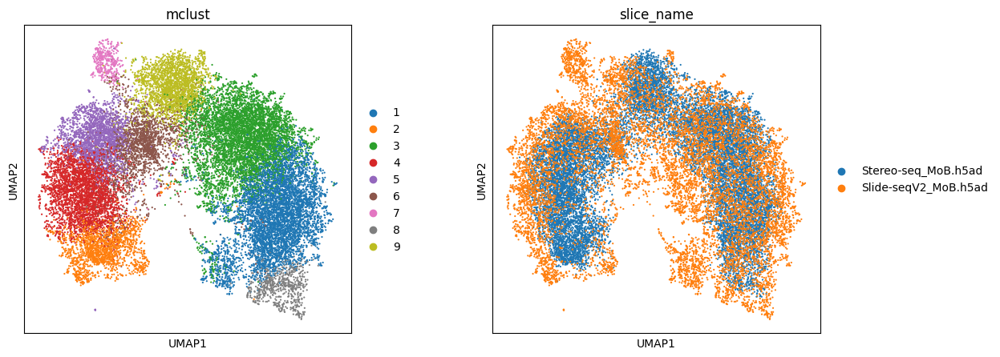

In [ ]:
sc.pp.neighbors(adata_new, use_rep='mx')
sc.tl.umap(adata_new)
plt.rcParams["figure.figsize"] = (5, 5)
sc.pl.umap(adata_new, color=["mclust", 'slice_name'], ncols=3,wspace=0.3, show=True,size=10)

/home/zl/anaconda3/envs/pyg/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


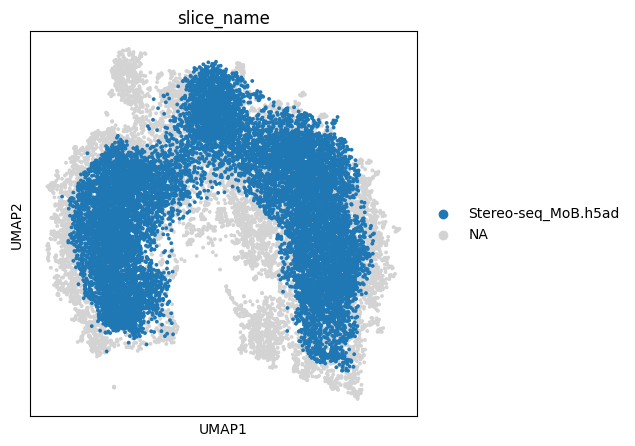

In [ ]:
sc.pl.umap(adata_new, color='slice_name', groups=[sections[0]],size=30)

In [ ]:
abs(adata_new.obsm['mx'][3]).sum()

117.33093

In [ ]:
import torch
aa = mucostx.model.batch_emb(torch.tensor([0]).to('cuda'))
abs(aa).sum()

tensor(11.0269, device='cuda:0', grad_fn=<SumBackward0>)

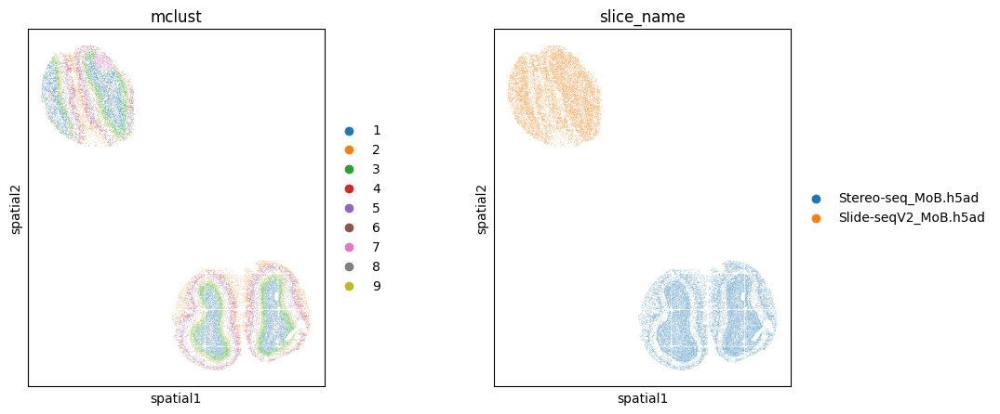

In [ ]:
sc.pl.spatial(adata_new,color=['mclust',"slice_name"], spot_size=20)

/home/zl/anaconda3/envs/pyg/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


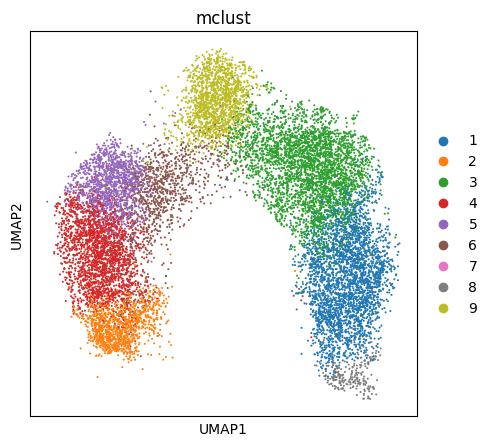

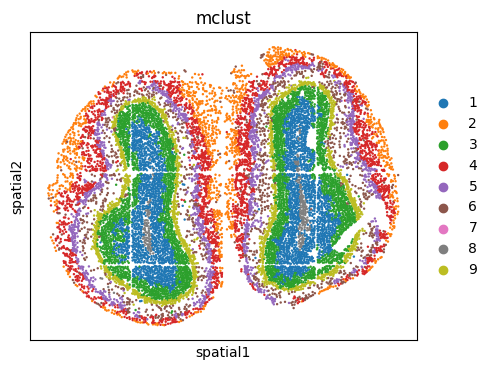

/home/zl/anaconda3/envs/pyg/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


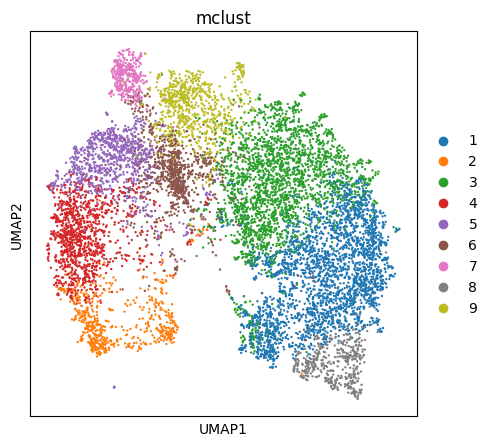

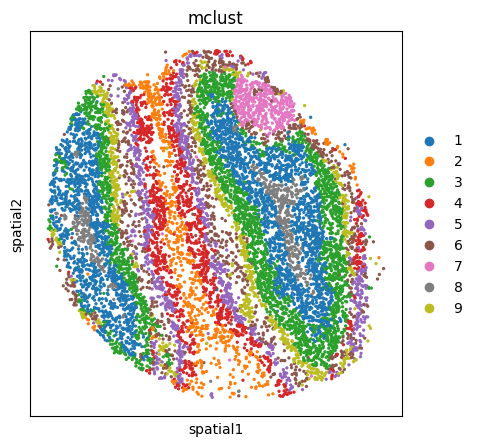

In [ ]:
for i, sli in enumerate(sections):
    adata_151 = adata_new[adata_new.obs['slice_name']==sli,:]
    adata_151
    sc.pl.umap(adata_151, color=["mclust"])
    adata_151.uns = adata_list[i].uns
    sc.pl.spatial(adata_151,color=["mclust"], spot_size=40)

In [ ]:
---

SyntaxError: invalid syntax (1947214667.py, line 1)

In [ ]:
# save_dir = args.dataset_path+'adata_all/'
# os.makedirs(save_dir, exist_ok=True)

fitting ...
  |======================================================================| 100%


/home/zl/anaconda3/envs/pyg/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/zl/anaconda3/envs/pyg/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


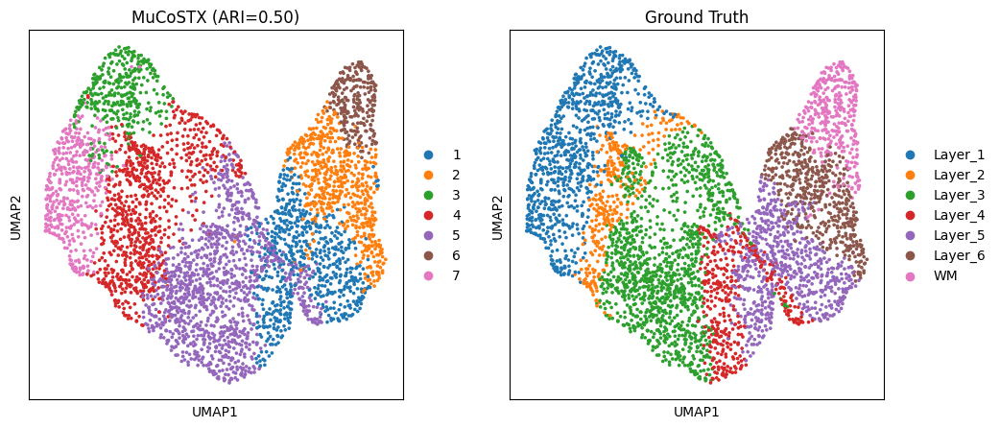

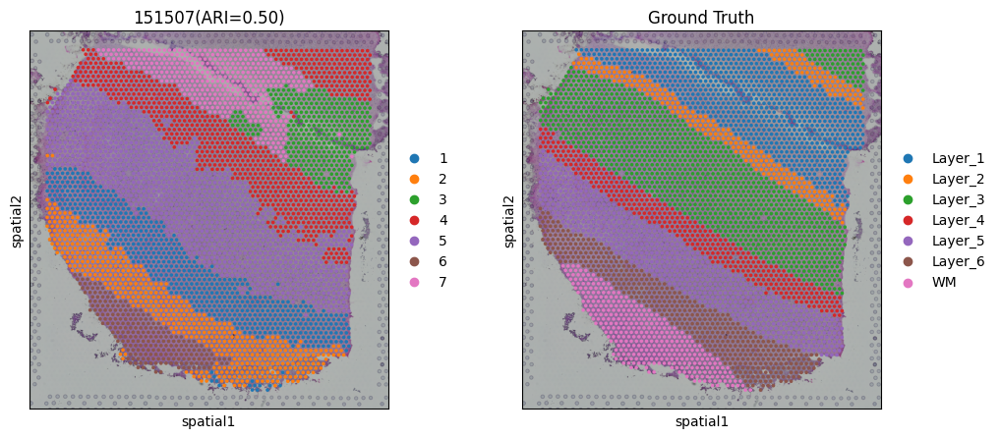

fitting ...
  |======================================================================| 100%


/home/zl/anaconda3/envs/pyg/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/zl/anaconda3/envs/pyg/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


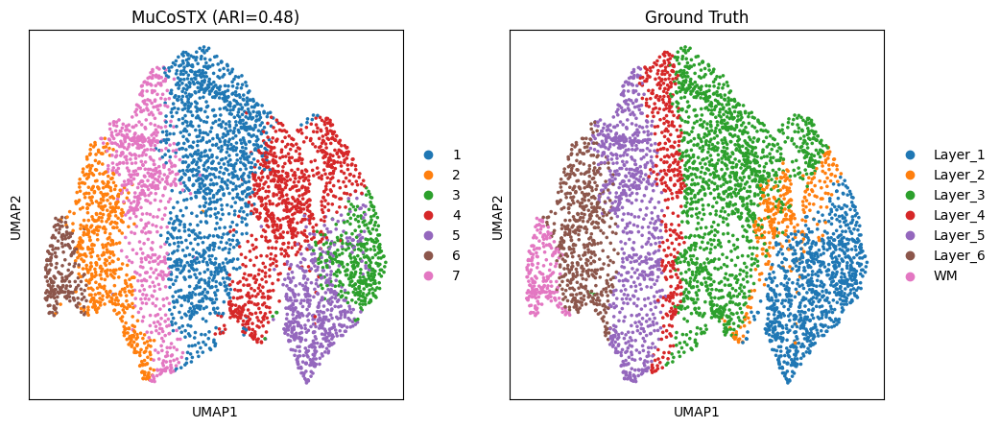

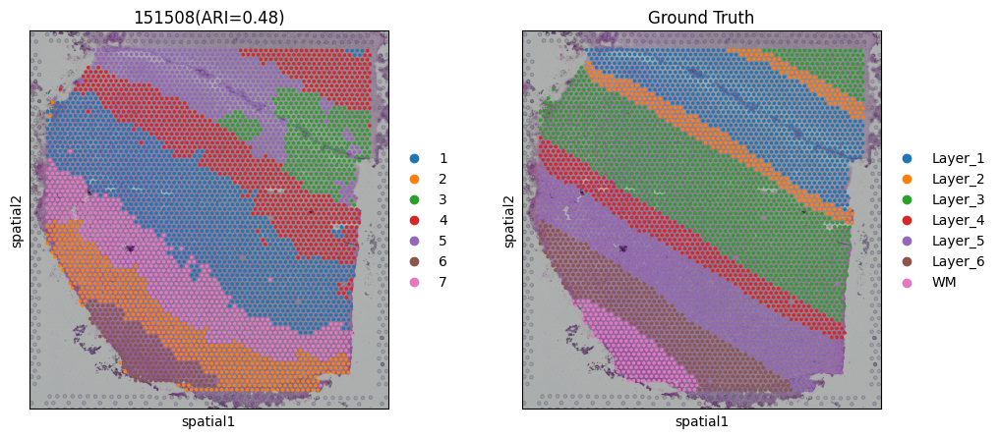

fitting ...
  |======================================================================| 100%


/home/zl/anaconda3/envs/pyg/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/zl/anaconda3/envs/pyg/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


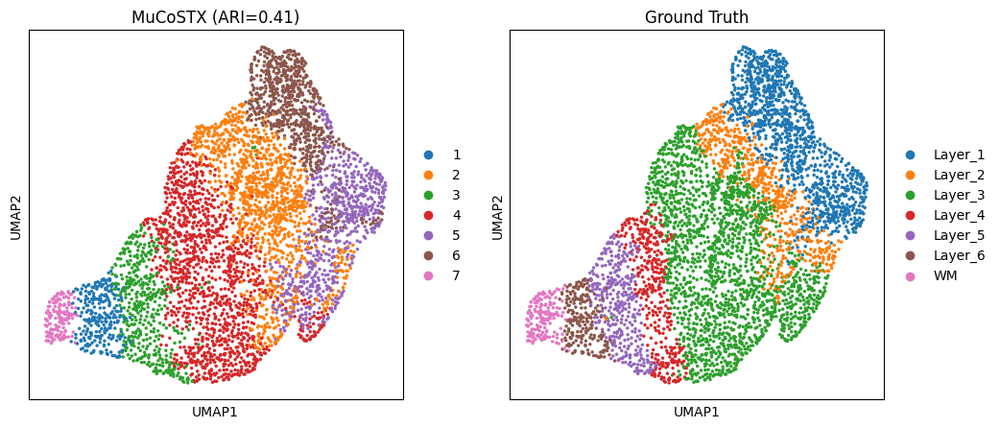

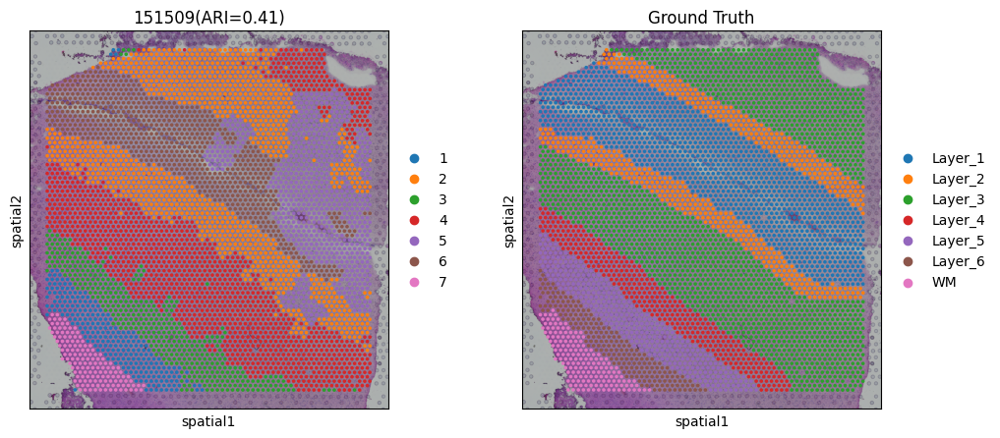

fitting ...
  |======================================================================| 100%


/home/zl/anaconda3/envs/pyg/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/zl/anaconda3/envs/pyg/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


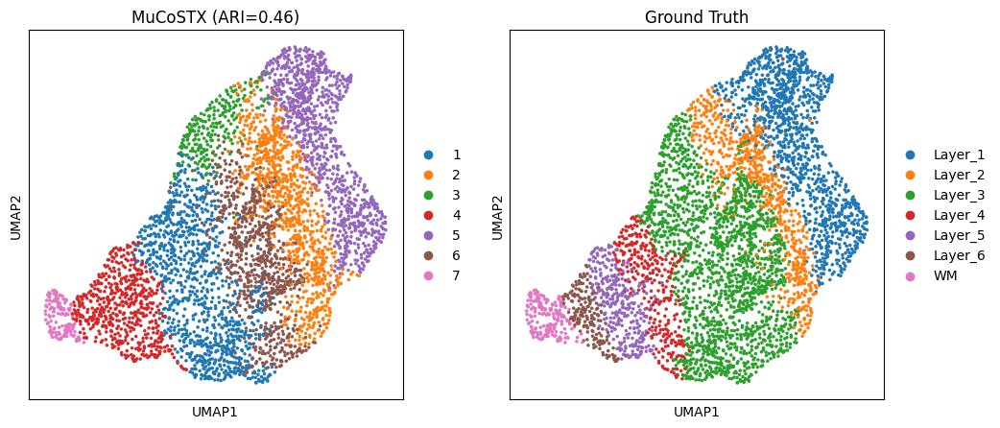

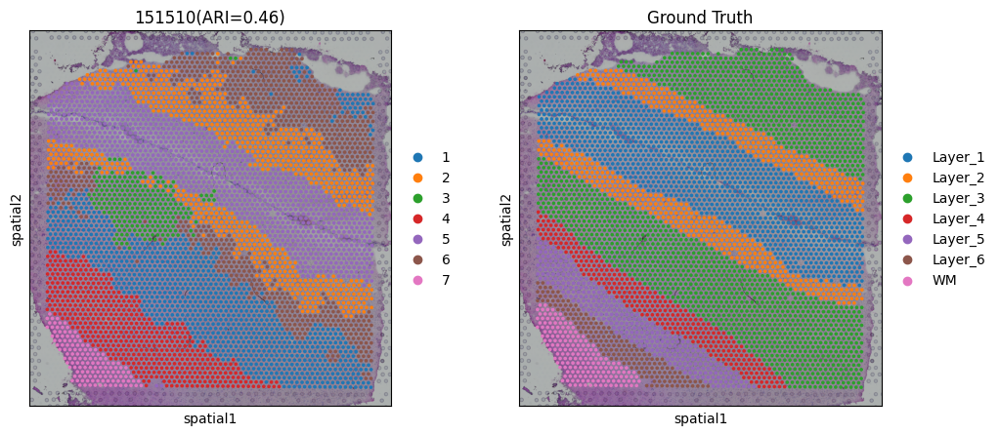

fitting ...
  |======================================================================| 100%


/home/zl/anaconda3/envs/pyg/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/zl/anaconda3/envs/pyg/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


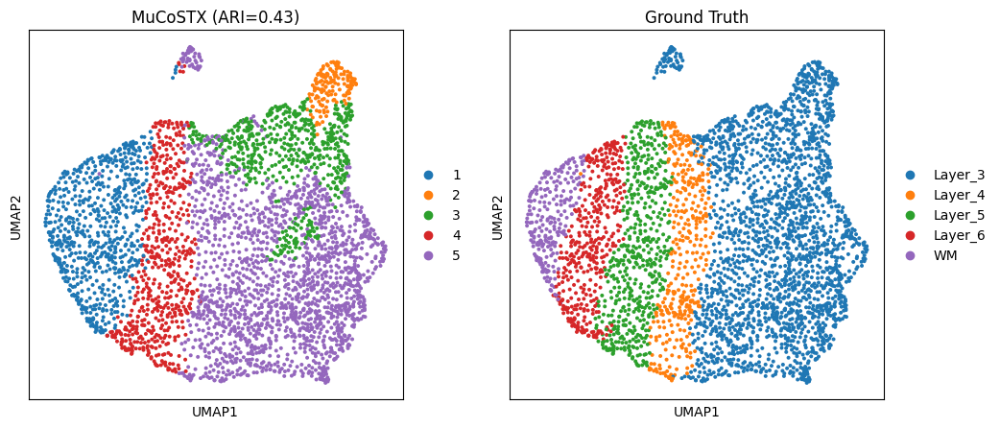

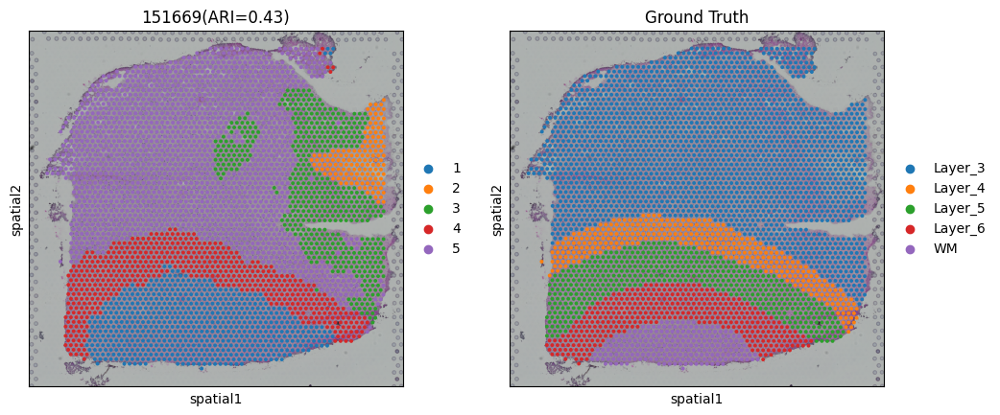

fitting ...
  |======================================================================| 100%


/home/zl/anaconda3/envs/pyg/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/zl/anaconda3/envs/pyg/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


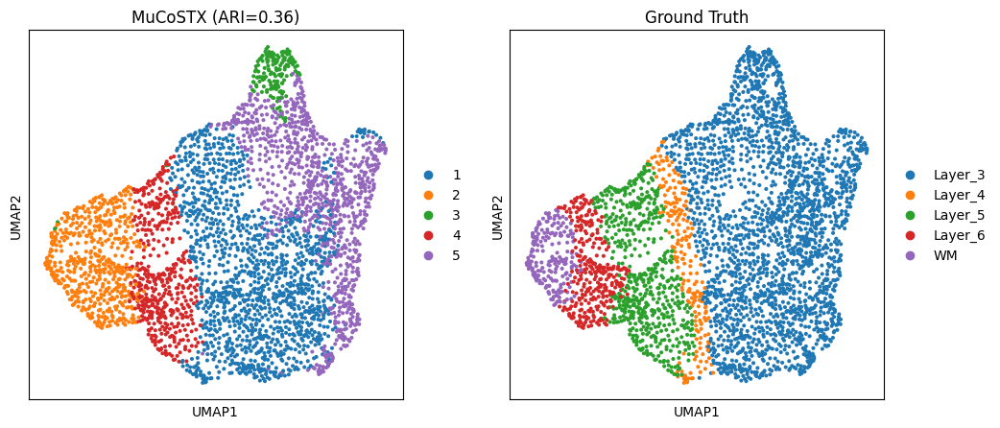

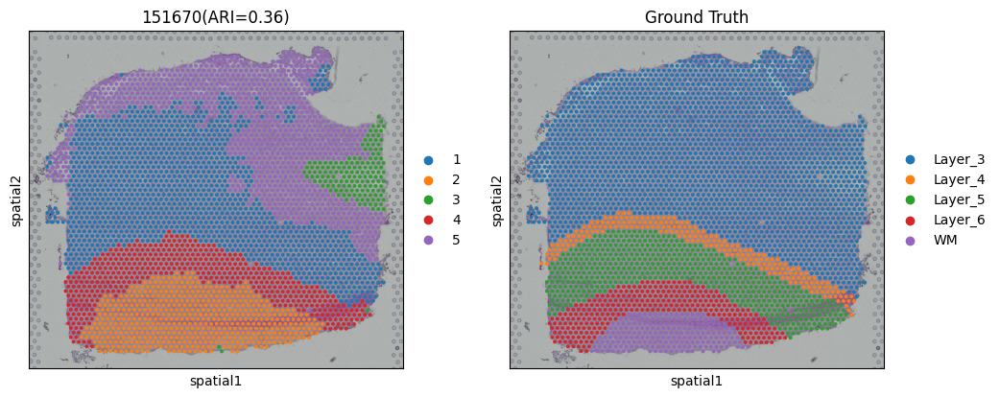

fitting ...
  |======================================================================| 100%


/home/zl/anaconda3/envs/pyg/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/zl/anaconda3/envs/pyg/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


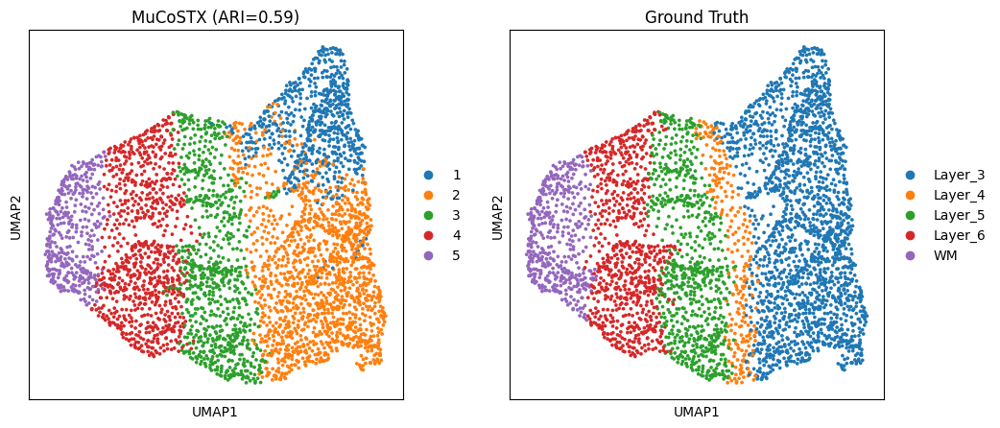

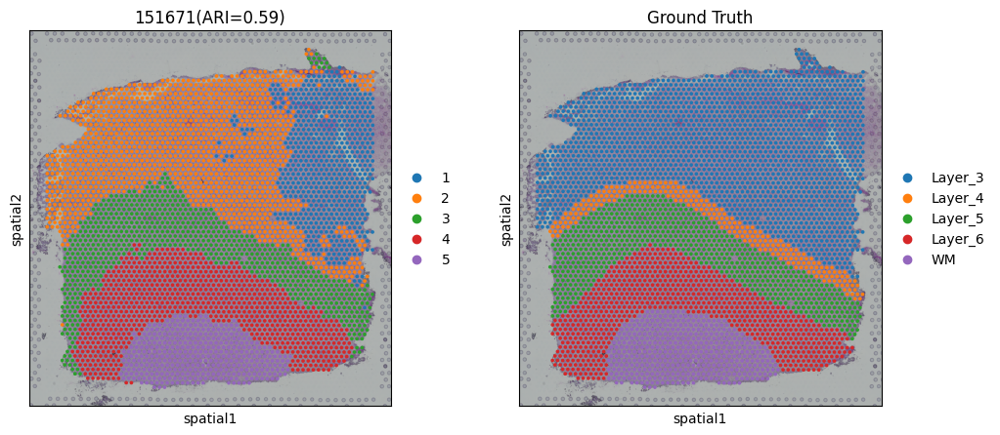

fitting ...
  |======================================================================| 100%


/home/zl/anaconda3/envs/pyg/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/zl/anaconda3/envs/pyg/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


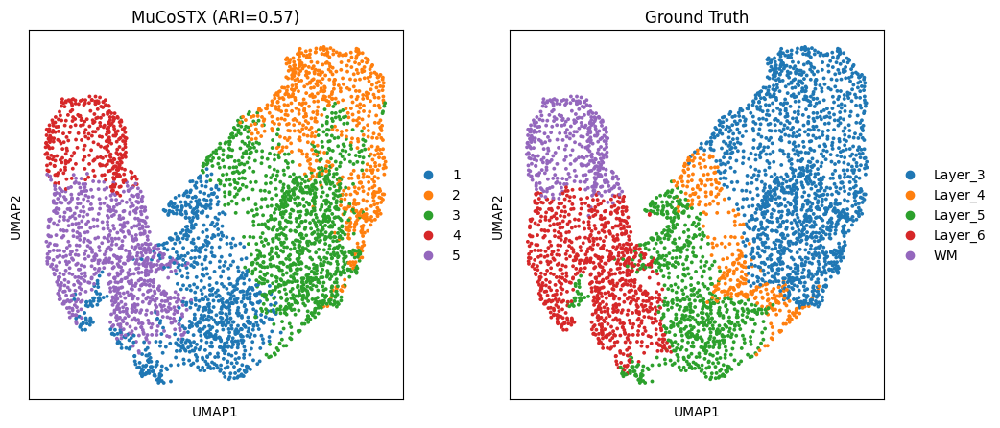

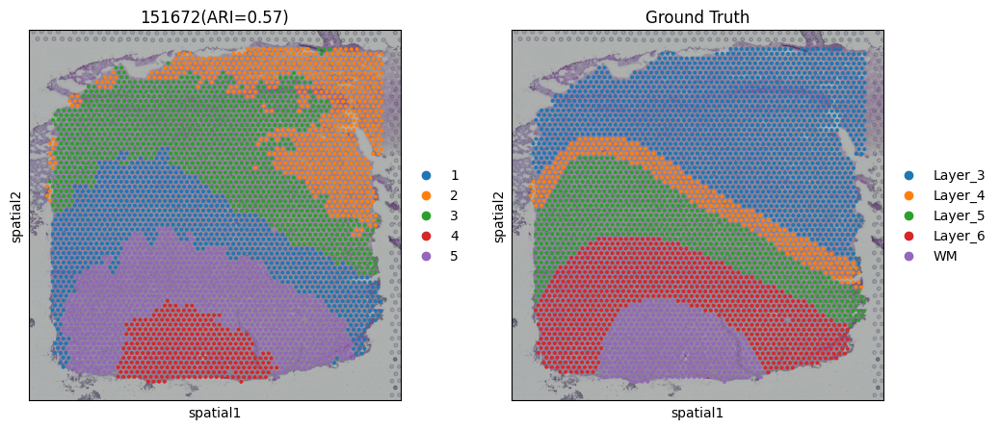

fitting ...
  |======================================================================| 100%


/home/zl/anaconda3/envs/pyg/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/zl/anaconda3/envs/pyg/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


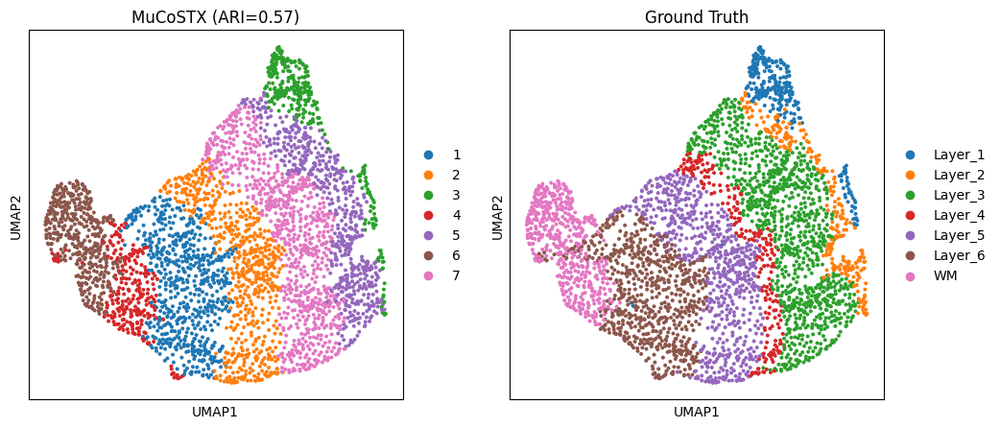

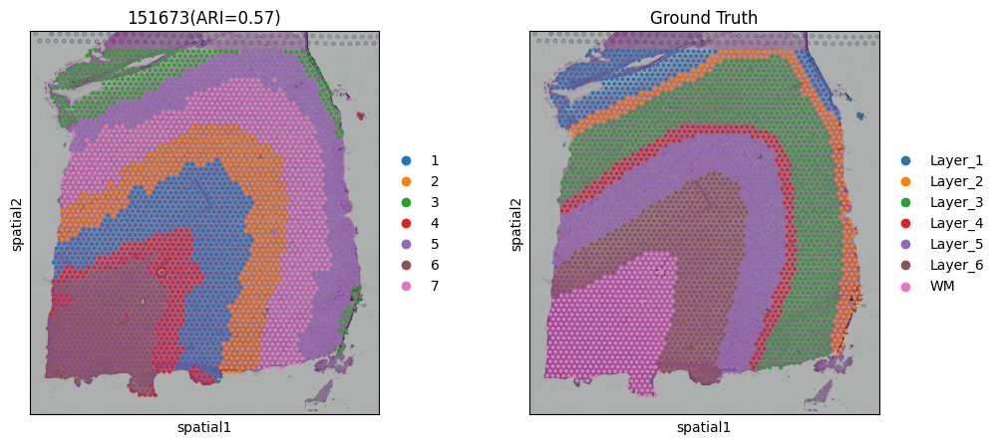

fitting ...
  |======================================================================| 100%


/home/zl/anaconda3/envs/pyg/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/zl/anaconda3/envs/pyg/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


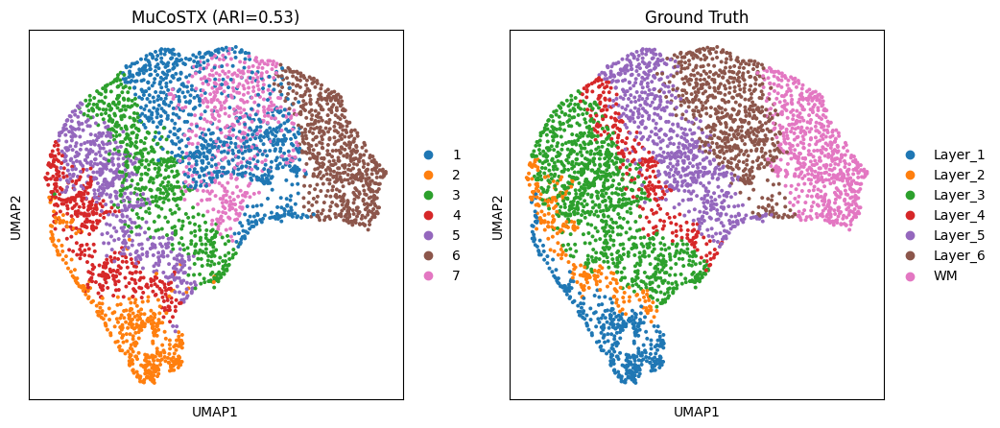

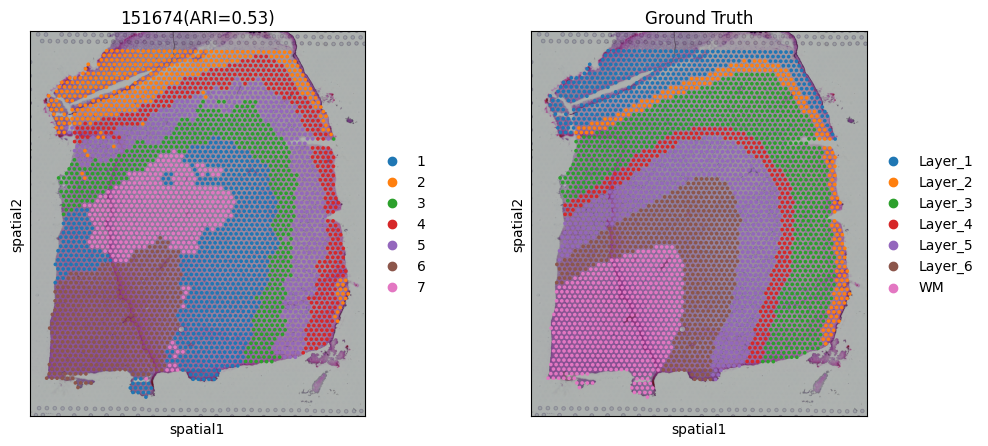

fitting ...
  |                                                                      |   0%

In [ ]:
ari = []
from sklearn.metrics import adjusted_rand_score
from mucostx.utils import mclust
n_d = [7,7,7,7,5,5,5,5,7,7,7,7]
# n_d = [7,7,7,7]
for i in range(12):
    adata_i = list_new[i]
    args.n_domain=n_d[i]
    adata_i = mclust(adata_i, args, refine=False, use='mx')
    adata_i = adata_i[~pd.isnull(adata_i.obs['Ground Truth'])]
    obs_df = adata_i.obs.dropna()
    ARI = adjusted_rand_score(obs_df['mclust'], obs_df['Ground Truth'])
    ari.append(ARI)
    sc.pp.neighbors(adata_i, use_rep='mx')
    sc.tl.umap(adata_i)
    plt.rcParams["figure.figsize"] = (5, 5)
    sc.pl.umap(adata_i, color=["mclust", "Ground Truth"], title=['MuCoSTX (ARI=%.2f)'%ARI, "Ground Truth"])
    sc.pl.spatial(adata_i,color=["mclust", "Ground Truth"], title=sections[i]+'(ARI=%.2f)'%ARI)

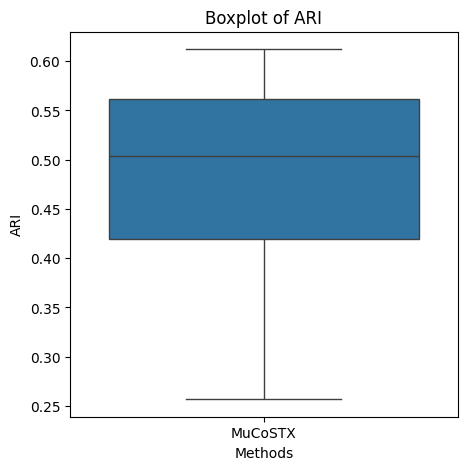

In [ ]:
import seaborn as sns
import pandas as pd

# 示例数据：多个列表
data = {
    "MuCoSTX": ari,
}

# 转换为 DataFrame
df = pd.DataFrame(dict([(k, pd.Series(v)) for k, v in data.items()]))

# 转换为长格式
df_melted = df.melt(var_name="Methods", value_name="ARI")

# 绘制箱线图
sns.boxplot(x="Methods", y="ARI", data=df_melted)

# 添加标题
plt.title("Boxplot of ARI")

# 显示图像
plt.show()
